In [1]:
!pip install -q rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 82.8 MB/s eta 0:00:00:00:0100:01


In [2]:
import os
import glob
import joblib
import cv2
import tifffile
import tifffile as tiff
import rasterio
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Suppress TensorFlow and other warnings
warnings.filterwarnings("ignore")


from pathlib import Path
from PIL import Image
from tqdm import tqdm, notebook
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier


import torch
import torch.nn as nn
import torch.optim as optim
from torch.cuda import amp
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision.transforms.functional as TF
import torchvision.transforms as T

import albumentations as A
from albumentations.pytorch import ToTensorV2


# Set random seeds for reproducibility
np.random.seed(27)
tf.random.set_seed(27)
cpu_count = os.cpu_count()

print("Num GPUs Available:", cpu_count)
print("TensorFlow is using GPU:", tf.test.is_gpu_available())

# Display versions
print(f"TensorFlow version: {tf.__version__}")
print(f"Keras version: {tf.keras.__version__}")
print(f"NumPy version: {np.__version__}")
print(f"OpenCV version: {cv2.__version__}")
print(f"pandas version: {pd.__version__}")

2025-04-30 15:05:35.411179: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746025535.598877      31 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746025535.656137      31 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Num GPUs Available: 4
TensorFlow is using GPU: True
TensorFlow version: 2.18.0
Keras version: 3.5.0
NumPy version: 1.26.4
OpenCV version: 4.11.0
pandas version: 2.2.3


I0000 00:00:1746025554.071357      31 gpu_device.cc:2022] Created device /device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


# PyTorch Profiler

In [3]:
import torch
import torch.nn as nn

def count_conv2d(m, x, y):
    x = x[0]

    cin = m.in_channels // m.groups
    cout = m.out_channels // m.groups
    kh, kw = m.kernel_size
    batch_size = x.size()[0]

    # ops per output element
    kernel_mul = kh * kw * cin
    kernel_add = kh * kw * cin - 1
    bias_ops = 1 if m.bias is not None else 0
    ops = kernel_mul + kernel_add + bias_ops

    # total ops
    num_out_elements = y.numel()
    total_ops = num_out_elements * ops

    # incase same conv is used multiple times
    m.total_ops += torch.tensor([int(total_ops)], device='cpu')

def count_bn2d(m, x, y):
    x = x[0]

    nelements = x.numel()
    total_sub = nelements
    total_div = nelements
    total_ops = total_sub + total_div

    m.total_ops += torch.tensor([int(total_ops)], device='cpu')

def count_relu(m, x, y):
    x = x[0]

    nelements = x.numel()
    total_ops = nelements

    m.total_ops += torch.tensor([int(total_ops)], device='cpu')

def count_softmax(m, x, y):
    x = x[0]

    batch_size, nfeatures = x.size()

    total_exp = nfeatures
    total_add = nfeatures - 1
    total_div = nfeatures
    total_ops = batch_size * (total_exp + total_add + total_div)

    m.total_ops += torch.tensor([int(total_ops)], device='cpu')

def count_maxpool(m, x, y):
    kernel_ops = torch.prod(torch.tensor([m.kernel_size], device='cpu')) - 1
    num_elements = y.numel()
    total_ops = kernel_ops * num_elements

    m.total_ops += torch.tensor([int(total_ops)], device='cpu')

def count_avgpool(m, x, y):
    total_add = torch.prod(torch.tensor([m.kernel_size], device='cpu')) - 1
    total_div = 1
    kernel_ops = total_add + total_div
    num_elements = y.numel()
    total_ops = kernel_ops * num_elements

    m.total_ops += torch.tensor([int(total_ops)], device='cpu')

def count_linear(m, x, y):
    # per output element
    total_mul = m.in_features
    total_add = m.in_features - 1
    num_elements = y.numel()
    total_ops = (total_mul + total_add) * num_elements

    m.total_ops += torch.tensor([int(total_ops)], device='cpu')

def count_convtranspose2d(m, x, y):
    x = x[0]

    cin = m.in_channels
    cout = m.out_channels
    kh, kw = m.kernel_size
    batch_size = x.size()[0]

    # ops per output element
    kernel_mul = kh * kw * cin
    kernel_add = kh * kw * cin - 1
    bias_ops = 1 if m.bias is not None else 0
    ops = kernel_mul + kernel_add + bias_ops

    num_out_elements = y.numel()
    total_ops = num_out_elements * ops

    m.total_ops += torch.tensor([int(total_ops)], device='cpu')

def profile(model, input_size, custom_ops = {}):
    """
    Profile model to count FLOPs and parameters.
    Works with models on any device (CPU or CUDA).
    
    Args:
        model: PyTorch model to profile
        input_size: Input tensor size (tuple), e.g. (batch_size, channels, height, width)
        custom_ops: Dictionary of custom operations counting functions
        
    Returns:
        total_ops: Total number of floating point operations
        total_params: Total number of parameters
    """
    model.eval()
    
    # Store original device
    orig_device = next(model.parameters()).device

    def add_hooks(m):
        if len(list(m.children())) > 0: return
        m.register_buffer('total_ops', torch.zeros(1, device='cpu'))
        m.register_buffer('total_params', torch.zeros(1, device='cpu'))

        for p in m.parameters():
            m.total_params += torch.tensor([p.numel()], device='cpu')

        if isinstance(m, nn.Conv2d):
            m.register_forward_hook(count_conv2d)
        elif isinstance(m, nn.BatchNorm2d):
            m.register_forward_hook(count_bn2d)
        elif isinstance(m, nn.ReLU):
            m.register_forward_hook(count_relu)
        elif isinstance(m, (nn.MaxPool1d, nn.MaxPool2d, nn.MaxPool3d)):
            m.register_forward_hook(count_maxpool)
        elif isinstance(m, (nn.AvgPool1d, nn.AvgPool2d, nn.AvgPool3d)):
            m.register_forward_hook(count_avgpool)
        elif isinstance(m, nn.ConvTranspose2d):
            m.register_forward_hook(count_convtranspose2d)
        elif isinstance(m, nn.Linear):
            m.register_forward_hook(count_linear)
        elif isinstance(m, (nn.Dropout, nn.Dropout2d, nn.Dropout3d)):
            pass
        else:
            print("Not implemented for ", m)

    model.apply(add_hooks)

    # Create input tensor on the same device as the model
    x = torch.zeros(input_size, device=orig_device)
    model(x)

    total_ops = 0
    total_params = 0
    for m in model.modules():
        if len(list(m.children())) > 0: continue
        total_ops += m.total_ops
        total_params += m.total_params

    # Convert to Python scalar
    if isinstance(total_ops, torch.Tensor):
        total_ops = int(total_ops.item())
    if isinstance(total_params, torch.Tensor):
        total_params = int(total_params.item())

    return total_ops, total_params

def run_profiler(model, input_size=(16, 4, 256, 256), output_file="model_logs.txt"):
    """
    Run profiler on model and save results to file
    
    Args:
        model: PyTorch model to profile
        input_size: Input tensor size (tuple)
        output_file: Path to save results
    """
    # Run the profiler to get number of operations and parameters
    num_ops, num_params = profile(model, input_size)

    # Format ops in GFLOPs for better readability
    gflops = num_ops / (10**9)
    
    # Write results to a log file
    with open(output_file, "w") as f:
        f.write(f"Number of parameters: {num_params:,}\n")
        f.write(f"Number of operations: {num_ops:,} FLOPs\n")
        f.write(f"                    : {gflops:.2f} GFLOPs\n")

    print(f"✅ Profiling done. Results saved to {output_file}.")
    print(f"   Parameters: {num_params:,}")
    print(f"   Operations: {gflops:.2f} GFLOPs")
    
    return num_ops, num_params

# Utils

In [4]:
# Dice coefficient function for model evaluation
def dice_coef(pred, target, smooth=1e-7):
    pred = torch.sigmoid(pred)
    pred = (pred > 0.5).float()
    intersection = (pred * target).sum(dim=(1, 2, 3))
    union = pred.sum(dim=(1, 2, 3)) + target.sum(dim=(1, 2, 3))
    dice = (2. * intersection + smooth) / (union + smooth)
    return dice.mean()

# Metric
def dice_score(y_true, y_pred, smooth=1e-7):
    y_true = y_true.view(-1)
    y_pred = y_pred.view(-1)
    intersection = (y_true * y_pred).sum()
    return (2. * intersection + smooth) / (y_true.sum() + y_pred.sum() + smooth)


class BCEDiceLoss(nn.Module):
    def __init__(self): 
        super().__init__()
        self.bce = nn.BCEWithLogitsLoss()

    def forward(self, inputs, targets):
        bce_loss = self.bce(inputs, targets)
        dice_loss = 1 - dice_coef(inputs, targets)
        return 0.5 * bce_loss + 0.5 * dice_loss

# Loss function based on dice coefficient
def dice_loss(y_true, y_pred):
    return 1 - dice_coef(y_true, y_pred)

# Read TIFF image and normalize
def read_tiff(file_path):
    try:
        img = tifffile.imread(file_path)
        # If image is 3D, ensure it has 4 channels (R,G,B,NIR)
        if len(img.shape) == 3:
            if img.shape[0] == 4:  # Channels first
                img = np.transpose(img, (1, 2, 0))
            elif img.shape[0] != 4 and img.shape[2] == 4:
                pass  # Already in the right format (H,W,C)
            else:
                raise ValueError(f"Unexpected image shape: {img.shape}")
        
        # Normalize each channel separately to [0, 1]
        img = img.astype(np.float32)
        for i in range(img.shape[2]):
            channel = img[:, :, i]
            min_val = np.min(channel)
            max_val = np.max(channel)
            if max_val > min_val:
                img[:, :, i] = (channel - min_val) / (max_val - min_val)
        
        return img
    except Exception as e:
        print(f"Error reading {file_path}: {e}")
        raise e
def rle_encode(mask):
    """
    Encodes a binary mask using Run-Length Encoding (RLE).    
    Args:
        mask (np.ndarray): 2D binary mask (0s and 1s).
    Returns:
        str: RLE-encoded string, or a single space " " if mask is all zeros.
    """
    if np.sum(mask) == 0:
        return " "  # As it seems that kaggle reject nulls. We'll handle cloud-free images with empty spaces.
    
    pixels = mask.flatten(order='F')  # Flatten in column-major order
    pixels = np.concatenate([[0], pixels, [0]])  # Add padding to detect transitions
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1  # Get transition indices
    runs[1::2] -= runs[::2]  # Compute run lengths
    runs[::2] -= 1  # Make it 0-indexed instead of 1-indexed

    return " ".join(map(str, runs))  # Convert to string format
    
# Read mask and convert to binary
def read_mask(file_path):
    try:
        mask = tifffile.imread(file_path)
        mask = mask.astype(np.float32)  
        mask = np.expand_dims(mask, axis=-1) if len(mask.shape) == 2 else mask
        return mask
    except Exception as e:
        print(f"Error reading mask {file_path}: {e}")
        raise e
        
def predict_and_display_by_name(name, model, device):
    model.eval()

    image_path = IMGS_DIR / f"{name}.tif"
    mask_path = MASKS_DIR / f"{name}.tif"

    image = tiff.imread(image_path)
    image_np = np.array(image)

    if image_np.ndim == 2:
        image_np = np.expand_dims(image_np, axis=-1)

    if image_np.shape[2] == 4:
        rgb_image = image_np[..., :3]
        ir_band = image_np[..., 3:]
    else:
        raise ValueError("Expected 4 channels (RGB+IR), got shape: {}".format(image_np.shape))

    image_tensor = torch.tensor(image_np.transpose(2, 0, 1), dtype=torch.float32) / 255.0
    image_tensor = T.Resize((256, 256))(image_tensor)
    input_tensor = image_tensor.unsqueeze(0).to(device)

    with torch.no_grad(), amp.autocast():
        output = model(input_tensor)
        pred_mask = torch.sigmoid(output)
        pred_mask = (pred_mask > 0.5).float().squeeze()

    # Resize predicted mask to 512x512 to match ground truth
    pred_mask_resized = T.Resize((512, 512))(pred_mask.unsqueeze(0)).squeeze().cpu().numpy()

    img = read_tiff(image_path)

    if mask_path.exists():
        mask = read_mask(mask_path)
        mask_tensor = torch.tensor(mask.squeeze(), dtype=torch.float32)

        # ----- Dice Score -----
        pred_tensor = torch.tensor(pred_mask_resized, dtype=torch.float32)
        dice = dice_score(mask_tensor, pred_tensor)
        print(f"Dice Score: {dice:.4f}")

        # ----- Plotting -----
        fig, ax = plt.subplots(1, 4, figsize=(15, 5))
        ax[0].imshow(img[:, :, :3])
        ax[0].set_title("Input Image (RGB)")

        ax[1].imshow(img[:, :, 3], cmap='inferno')
        ax[1].set_title("Infrared Band")

        ax[2].imshow(mask_tensor.numpy(), cmap='gray')
        ax[2].set_title("Ground Truth Mask")

        ax[3].imshow(pred_mask_resized, cmap='gray')
        ax[3].set_title("Predicted Mask")

    plt.tight_layout()
    plt.show()
    
# Display sample images with their masks
def display_sample_images(image_files, mask_files, num_samples=3):
    np.random.seed(42)
    sample_indices = np.random.choice(len(image_files), num_samples, replace=False)
    
    plt.figure(figsize=(15, 5*num_samples))
    
    for i, idx in enumerate(sample_indices):
        # Load image and mask
        img = read_tiff(image_files[idx])
        mask = read_mask(mask_files[idx])
        
        # Display RGB bands
        plt.subplot(num_samples, 4, i*4 + 1)
        plt.imshow(img[:, :, :3])  # RGB bands
        plt.title(f"RGB - Sample {i+1}")
        plt.axis('off')
        
        # Display NIR band
        plt.subplot(num_samples, 4, i*4 + 2)
        plt.imshow(img[:, :, 3], cmap='inferno')
        plt.title(f"Infrared Band - Sample {i+1}")
        plt.axis('off')
        
        # Display mask
        plt.subplot(num_samples, 4, i*4 + 3)
        plt.imshow(mask[:, :, 0], cmap='gray')
        plt.title(f"Cloud Mask - Sample {i+1}")
        plt.axis('off')
        
        # Display RGB with mask overlay
        plt.subplot(num_samples, 4, i*4 + 4)
        rgb_img = img[:, :, :3].copy()
        mask_overlay = np.zeros_like(rgb_img)
        mask_overlay[:, :, 0] = mask[:, :, 0]  # Red channel
        alpha = 0.5
        overlay = rgb_img * (1 - alpha) + mask_overlay * alpha
        plt.imshow(overlay)
        plt.title(f"RGB with Mask Overlay - Sample {i+1}")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Lists for each category
no_clouds_names = []
partial_clouds_names = []
heavy_clouds_names = []
full_clouds_names = []

# Analyze cloud coverage in masks
def analyze_cloud_coverage(mask_files):
    coverages = []

    for mask_file in tqdm(mask_files, desc="Analyzing cloud coverage"):
        mask = read_mask(mask_file)
        coverage = np.mean(mask)
        percentage = coverage * 100
        coverages.append(percentage)

        # Categorize by coverage percentage
        if percentage < 1:
            no_clouds_names.append(mask_file.stem)
        elif 1 <= percentage < 50:
            partial_clouds_names.append(mask_file.stem)
        elif 50 <= percentage < 90:
            heavy_clouds_names.append(mask_file.stem)
        else:  # percentage >= 90
            full_clouds_names.append(mask_file.stem)

    return coverages

# Plot cloud coverage distribution
def plot_cloud_coverage_distribution(coverages):
    plt.figure(figsize=(10, 6))
    plt.hist(coverages, bins=20, alpha=0.7, color='skyblue', edgecolor='black')
    plt.axvline(np.mean(coverages), color='red', linestyle='dashed', linewidth=1, label=f'Mean: {np.mean(coverages):.2f}%')
    plt.xlabel('Cloud Coverage (%)')
    plt.ylabel('Number of Images')
    plt.title('Distribution of Cloud Coverage in Training Set')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()
    
    # Display additional statistics
    print(f"Cloud Coverage Statistics:")
    print(f"Mean: {np.mean(coverages):.2f}%")
    print(f"Median: {np.median(coverages):.2f}%")
    print(f"Min: {np.min(coverages):.2f}%")
    print(f"Max: {np.max(coverages):.2f}%")
    
    # Count images by coverage category
    no_clouds = len(no_clouds_names)
    partial_clouds = len(partial_clouds_names)
    heavy_clouds = len(heavy_clouds_names)
    full_clouds = len(full_clouds_names)
    
    print(f"\nCloud Coverage Categories:")
    print(f"No clouds (<1%): {no_clouds} images ({no_clouds/len(coverages)*100:.2f}%)")
    print(f"Partial clouds (1-50%): {partial_clouds} images ({partial_clouds/len(coverages)*100:.2f}%)")
    print(f"Heavy clouds (50-90%): {heavy_clouds} images ({heavy_clouds/len(coverages)*100:.2f}%)")
    print(f"Full cloud cover (>90%): {full_clouds} images ({full_clouds/len(coverages)*100:.2f}%)")


# EDA

Dataset directory exists: True
Images directory exists: True
Masks directory exists: True
Number of images: 10573
Number of masks: 10573
All image and mask filenames match perfectly.


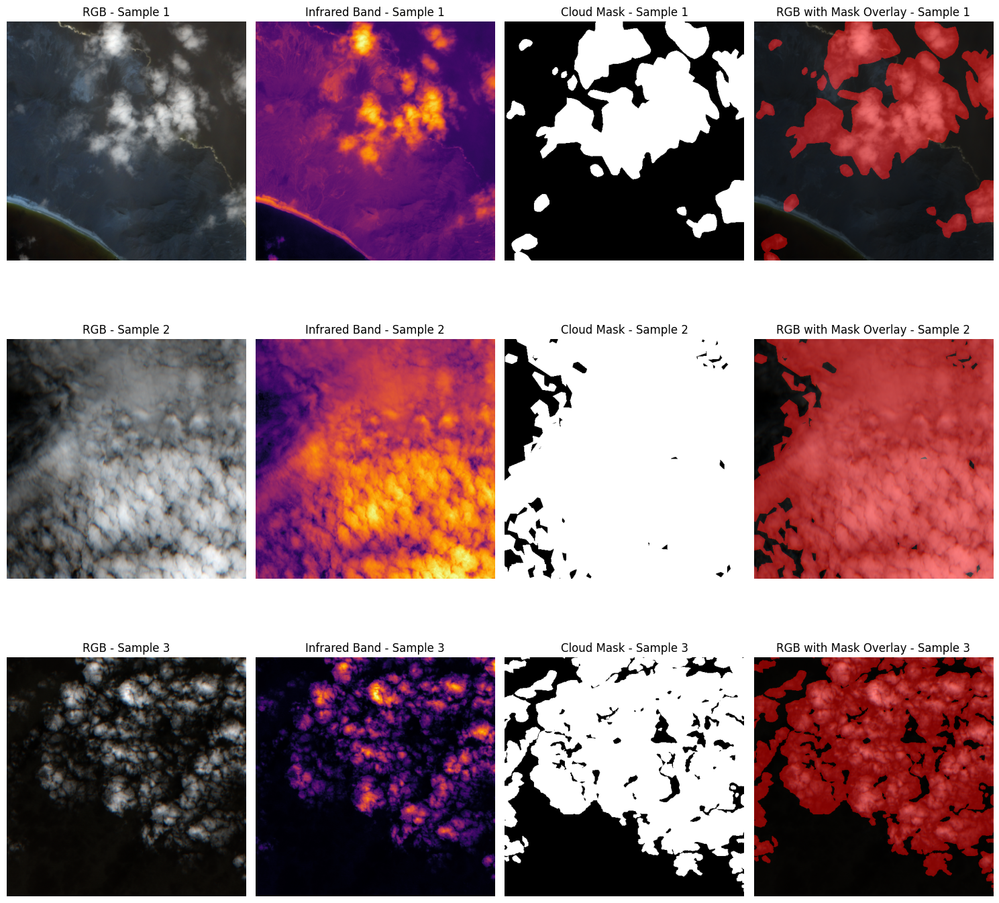

In [5]:
# Define dataset paths
DATASET_DIR = Path("/kaggle/input/cloud-masking-dataset/content/train")
IMGS_DIR = DATASET_DIR / "data"
MASKS_DIR = DATASET_DIR / "masks"

# Print existing directories to verify
print(f"Dataset directory exists: {DATASET_DIR.exists()}")
print(f"Images directory exists: {IMGS_DIR.exists()}")
print(f"Masks directory exists: {MASKS_DIR.exists()}")

# Get list of all image and mask files
img_paths = sorted(list(IMGS_DIR.glob("*.tif")))
mask_paths = sorted(list(MASKS_DIR.glob("*.tif")))

# Check if we have the same number of images and masks
print(f"Number of images: {len(img_paths)}")
print(f"Number of masks: {len(mask_paths)}")

# Verify that image and mask file names match
img_names = [img_path.stem for img_path in img_paths]
mask_names = [mask_path.stem for mask_path in mask_paths]

# Check for any mismatches
mismatches = set(img_names) ^ set(mask_names)
if mismatches:
    print(f"Found {len(mismatches)} mismatched files!")
    print("First few mismatches:", list(mismatches)[:5])
else:
    print("All image and mask filenames match perfectly.")

# Display a few sample images with their masks
display_sample_images(img_paths, mask_paths, num_samples=3)

Analyzing cloud coverage: 100%|██████████| 10573/10573 [01:28<00:00, 119.70it/s]


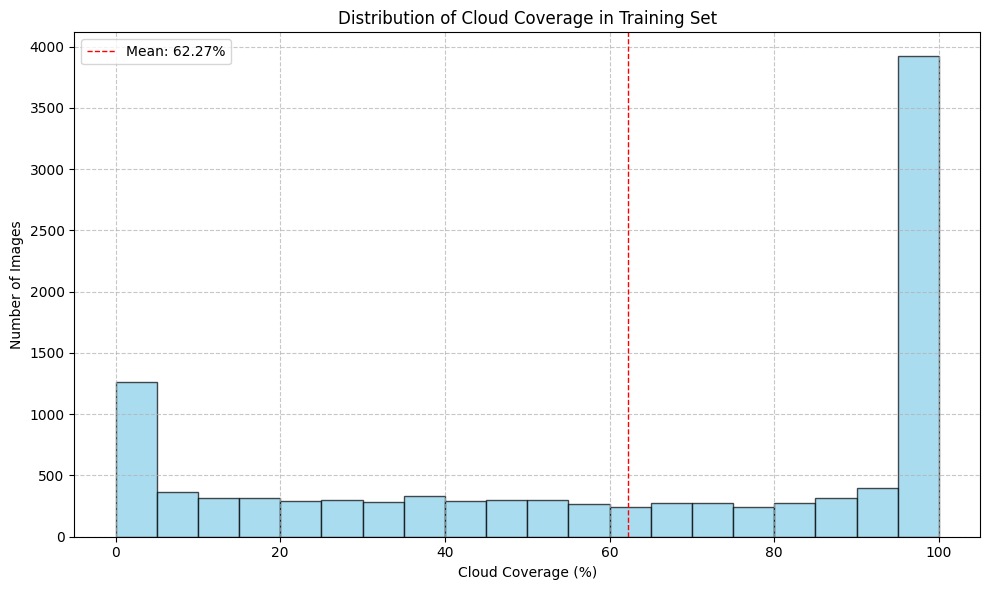

Cloud Coverage Statistics:
Mean: 62.27%
Median: 72.96%
Min: 0.00%
Max: 100.00%

Cloud Coverage Categories:
No clouds (<1%): 858 images (8.12%)
Partial clouds (1-50%): 3189 images (30.16%)
Heavy clouds (50-90%): 2210 images (20.90%)
Full cloud cover (>90%): 4316 images (40.82%)


In [6]:
# Analyze a subset of the data for efficiency 
cloud_coverage = analyze_cloud_coverage(mask_paths)
plot_cloud_coverage_distribution(cloud_coverage)

# UNet

In [7]:
class twoConv(nn.Module):
    def __init__(self, in_channel, out_channel):
        super(twoConv, self).__init__()  # Fixed class name
        self.conv = nn.Sequential(
            nn.Conv2d(in_channel, out_channel, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channel),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channel, out_channel, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channel),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.conv(x)

In [8]:
class UNet(nn.Module):
    def __init__(self, in_channel=4, out_channel=1, features=[64, 128, 256, 512]):  
        super(UNet, self).__init__()
        self.ups = nn.ModuleList()
        self.downs = nn.ModuleList()
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Down Part of UNet
        for feature in features:
            self.downs.append(twoConv(in_channel, feature))
            in_channel = feature

        # Upsampling part
        for feature in reversed(features):
            self.ups.append(nn.ConvTranspose2d(feature*2, feature, kernel_size=2, stride=2))
            self.ups.append(twoConv(feature*2, feature))
        
        self.bottleneck = twoConv(features[-1], features[-1]*2)
        self.final_conv = nn.Conv2d(features[0], out_channel, kernel_size=1)

    def forward(self, x):
        skip_connections = []
        for down in self.downs:
            x = down(x)
            skip_connections.append(x)
            x = self.pool(x)
        
        x = self.bottleneck(x)
        skip_connections = skip_connections[::-1]

        for idx in range(0, len(self.ups), 2):
            x = self.ups[idx](x)
            skip_connection = skip_connections[idx//2]
            if x.shape != skip_connection.shape:
                x = TF.resize(x, size=skip_connection.shape[2:])
            concat_skip = torch.cat((skip_connection, x), dim=1)
            x = self.ups[idx+1](concat_skip)
        return self.final_conv(x)


In [9]:
lr = 1e-4
device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)
batch_size = 16
num_epochs = 5
image_height = 256  
image_width = 256  

cuda


In [10]:
class CloudSegDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform=None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, ix):
        image_path = self.image_paths[ix]
        mask_path = self.mask_paths[ix]

        with rasterio.open(image_path) as src:
            image = src.read().transpose(1, 2, 0)  # (H, W, C)

        with rasterio.open(mask_path) as src:
            mask = src.read(1).astype(np.float32)  # Assuming mask is single-channel
            mask[mask > 0] = 1.0  # Convert to binary

        if self.transform is not None:
            augmented = self.transform(image=image, mask=mask)
            image = augmented["image"]
            mask = augmented["mask"]

        return image, mask.unsqueeze(0) 

In [11]:

# Image transformations
train_transform = A.Compose([
    A.Resize(height=image_height, width=image_width),
    A.Rotate(limit=35, p=0.5),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.1),
    A.Normalize(
        mean=[0.0, 0.0, 0.0, 0.0],  # 4 channels: R,G,B,IR
        std=[1.0, 1.0, 1.0, 1.0],
        max_pixel_value=255.0,
    ),
    ToTensorV2()
])

val_transform = A.Compose([
    A.Resize(height=image_height, width=image_width),
    A.Normalize(
        mean=[0.0, 0.0, 0.0, 0.0],  # 4 channels: R,G,B,IR
        std=[1.0, 1.0, 1.0, 1.0],
        max_pixel_value=255.0,
    ),
    ToTensorV2()
])

In [12]:
# Split into train and val
train_imgs, val_imgs, train_masks, val_masks = train_test_split(
    img_paths, mask_paths, train_size=0.8, random_state=27
)

# Create Dataset objects
train_ds = CloudSegDataset(train_imgs, train_masks, transform=train_transform)
val_ds = CloudSegDataset(val_imgs, val_masks, transform=val_transform)

# Create data loaders
train_dataloader = DataLoader(
    train_ds, 
    batch_size=batch_size, 
    shuffle=True, 
    num_workers=cpu_count-1,  
    pin_memory=True
)
val_dataloader = DataLoader(
    val_ds, 
    batch_size=batch_size, 
    shuffle=False, 
    num_workers=cpu_count-1,
    pin_memory=True
)
print(f"Train Dataset Size: {len(train_ds)}")
print(f"Validation Dataset Size: {len(val_ds)}")
sample_img, sample_mask = train_ds[0]
print(f"Sample Image Shape: {sample_img.shape}")
print(f"Sample Mask Shape: {sample_mask.shape}")

Train Dataset Size: 8458
Validation Dataset Size: 2115
Sample Image Shape: torch.Size([4, 256, 256])
Sample Mask Shape: torch.Size([1, 256, 256])


In [13]:
# Initialize the model
model = UNet(in_channel=4, out_channel=1).to(device)  # 4 input channels for R,G,B,IR

# Loss function and optimizer
loss_fn = BCEDiceLoss()
optimizer = optim.Adam(model.parameters(), lr=lr)

# Use mixed precision training if cuda is available
if torch.cuda.is_available():
    scaler = torch.cuda.amp.GradScaler()

In [14]:
# Track loss & dice
train_losses = []
val_losses = []
val_dices = []


for epoch in range(num_epochs):
    # ---------- Training ----------
    model.train()
    running_loss = 0.0
    loop = tqdm(train_dataloader, desc=f"Epoch [{epoch+1}/{num_epochs}]")

    for batch_idx, (images, masks) in enumerate(loop):
        images = images.to(device, non_blocking=True)
        masks = masks.float().to(device, non_blocking=True)

        with amp.autocast(dtype=torch.float16):
            outputs = model(images)
            loss = loss_fn(outputs, masks)

        optimizer.zero_grad(set_to_none=True)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item()
        loop.set_postfix(loss=loss.item())

    avg_train_loss = running_loss / len(train_dataloader)
    train_losses.append(avg_train_loss)

    # ---------- Validation ----------
    model.eval()
    val_loss = 0.0
    dice_total = 0.0

    with torch.no_grad():
        for batch_idx, (images, masks) in enumerate(tqdm(val_dataloader, desc="Validating...", leave=False)):
            images = images.to(device)
            masks = masks.float().to(device)

            with amp.autocast(dtype=torch.float16):
                outputs = model(images)
                loss = loss_fn(outputs, masks)

            preds = torch.sigmoid(outputs)
            preds = (preds > 0.5).float()

            val_loss += loss.item()
            dice_total += dice_score(masks, preds)

    avg_val_loss = val_loss / len(val_dataloader)
    avg_val_dice = dice_total / len(val_dataloader)
    val_losses.append(avg_val_loss)
    val_dices.append(avg_val_dice.item())

    # ---------- Summary ----------
    print(f"\n✅ Epoch [{epoch+1}/{num_epochs}]")
    print(f"Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f} | Dice Score: {avg_val_dice:.4f}")
    print("-" * 50)

Epoch [1/5]: 100%|██████████| 529/529 [03:29<00:00,  2.52it/s, loss=0.254]



✅ Epoch [1/5]
Train Loss: 0.2742 | Val Loss: 0.2382 | Dice Score: 0.9063
--------------------------------------------------


Epoch [2/5]: 100%|██████████| 529/529 [03:27<00:00,  2.55it/s, loss=0.356] 



✅ Epoch [2/5]
Train Loss: 0.2313 | Val Loss: 0.2053 | Dice Score: 0.9188
--------------------------------------------------


Epoch [3/5]: 100%|██████████| 529/529 [03:27<00:00,  2.55it/s, loss=0.192] 



✅ Epoch [3/5]
Train Loss: 0.2160 | Val Loss: 0.1935 | Dice Score: 0.9234
--------------------------------------------------


Epoch [4/5]: 100%|██████████| 529/529 [03:27<00:00,  2.55it/s, loss=0.219] 



✅ Epoch [4/5]
Train Loss: 0.2075 | Val Loss: 0.1901 | Dice Score: 0.9239
--------------------------------------------------


Epoch [5/5]: 100%|██████████| 529/529 [03:27<00:00,  2.55it/s, loss=0.0979]
                                                                


✅ Epoch [5/5]
Train Loss: 0.2019 | Val Loss: 0.1872 | Dice Score: 0.9275
--------------------------------------------------


In [15]:
model_name = f"model_best_dice_{val_dices[-1]*100:.2f}_loss_{val_losses[-1]*100:.2f}.pth"
torch.save(model.state_dict(), model_name)

Dice Score: 0.9410


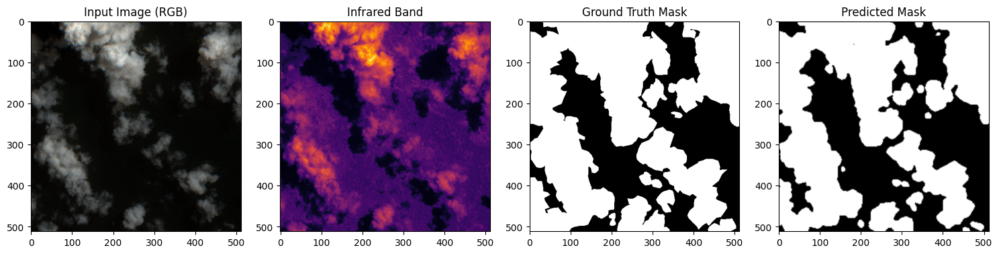

In [16]:
predict_and_display_by_name("100425", model, device)

# Data Processing

In [17]:
# Loop over all images
kept_img_paths = []
kept_mask_paths = []

removed_img_paths = []
removed_mask_paths = []

dice_total=0

for img_path, mask_path in tqdm(zip(img_paths, mask_paths), total=len(img_paths), desc="Filtering by Dice"):
    image = tiff.imread(img_path)
    image_np = np.array(image)

    if image_np.ndim == 2:
        image_np = np.expand_dims(image_np, axis=-1)

    if image_np.shape[2] == 4:
        rgb_image = image_np[..., :3]
        ir_band = image_np[..., 3:]
    else:
        raise ValueError("Expected 4 channels (RGB+IR), got shape: {}".format(image_np.shape))

    image_tensor = torch.tensor(image_np.transpose(2, 0, 1), dtype=torch.float32) / 255.0
    image_tensor = T.Resize((256, 256))(image_tensor)
    input_tensor = image_tensor.unsqueeze(0).to(device)

    mask = read_mask(mask_path)
    mask_tensor = torch.tensor(mask.squeeze(), dtype=torch.float32)
    with torch.no_grad(), amp.autocast():
        output = model(input_tensor)
        pred_mask = torch.sigmoid(output)
        pred_mask = (pred_mask > 0.5).float().squeeze()

    # Resize predicted mask to 512x512 to match ground truth
    pred_mask_resized = T.Resize((512, 512))(pred_mask.unsqueeze(0)).squeeze().cpu().numpy()
    

    # ----- Dice Score -----
    pred_tensor = torch.tensor(pred_mask_resized, dtype=torch.float32)
    dice = dice_score(mask_tensor, pred_tensor)
    dice_total+=dice

    if dice >= 0.70:
        kept_img_paths.append(img_path)
        kept_mask_paths.append(mask_path)
    else:
        removed_img_paths.append(img_path)
        removed_mask_paths.append(mask_path)

dice_avg=dice_total/len(img_paths)

# Update the original lists
img_paths = kept_img_paths
mask_paths = kept_mask_paths

print(f"✅ Done filtering. Removed: {len(removed_img_paths)} images with Dice >= 70%.")
print(f"✅ Done filtering. Remaining: {len(img_paths)} images with Dice >= 70%.")
print(f"Avg Dice Score in all data {dice_avg}")

Filtering by Dice: 100%|██████████| 10573/10573 [04:06<00:00, 42.91it/s]

✅ Done filtering. Removed: 1249 images with Dice >= 70%.
✅ Done filtering. Remaining: 9324 images with Dice >= 70%.
Avg Dice Score in all data 0.8663396835327148


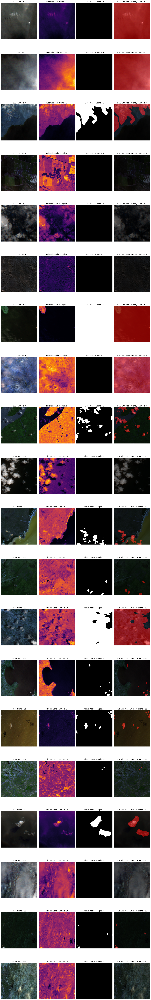

In [19]:
# Display a few sample images with their masks
display_sample_images(removed_img_paths, removed_mask_paths, num_samples=20)

In [20]:
# Split into train and val
train_imgs, val_imgs, train_masks, val_masks = train_test_split(
    img_paths, mask_paths, train_size=0.8, random_state=27
)

# Create Dataset objects
train_ds = CloudSegDataset(train_imgs, train_masks, transform=train_transform)
val_ds = CloudSegDataset(val_imgs, val_masks, transform=val_transform)

# Create data loaders
train_dataloader = DataLoader(
    train_ds, 
    batch_size=batch_size, 
    shuffle=True, 
    num_workers=cpu_count-1,  
    pin_memory=True
)
val_dataloader = DataLoader(
    val_ds, 
    batch_size=batch_size, 
    shuffle=False, 
    num_workers=cpu_count-1,
    pin_memory=True
)
print(f"Train Dataset Size: {len(train_ds)}")
print(f"Validation Dataset Size: {len(val_ds)}")
sample_img, sample_mask = train_ds[0]
print(f"Sample Image Shape: {sample_img.shape}")
print(f"Sample Mask Shape: {sample_mask.shape}")

Train Dataset Size: 7459
Validation Dataset Size: 1865
Sample Image Shape: torch.Size([4, 256, 256])
Sample Mask Shape: torch.Size([1, 256, 256])


In [21]:
# Initialize the model
new_model = UNet(in_channel=4, out_channel=1).to(device)
optimizer = optim.Adam(new_model.parameters(), lr=lr)
num_epochs=10

In [22]:
# Track loss & dice
train_losses = []
val_losses = []
val_dices = []


for epoch in range(num_epochs):
    # ---------- Training ----------
    new_model.train()
    running_loss = 0.0
    loop = tqdm(train_dataloader, desc=f"Epoch [{epoch+1}/{num_epochs}]")

    for batch_idx, (images, masks) in enumerate(loop):
        images = images.to(device, non_blocking=True)
        masks = masks.float().to(device, non_blocking=True)

        with amp.autocast(dtype=torch.float16):
            outputs = new_model(images)
            loss = loss_fn(outputs, masks)

        optimizer.zero_grad(set_to_none=True)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item()
        loop.set_postfix(loss=loss.item())

    avg_train_loss = running_loss / len(train_dataloader)
    train_losses.append(avg_train_loss)

    # ---------- Validation ----------
    new_model.eval()
    val_loss = 0.0
    dice_total = 0.0

    with torch.no_grad():
        for batch_idx, (images, masks) in enumerate(tqdm(val_dataloader, desc="Validating...", leave=False)):
            images = images.to(device)
            masks = masks.float().to(device)

            with amp.autocast(dtype=torch.float16):
                outputs = new_model(images)
                loss = loss_fn(outputs, masks)

            preds = torch.sigmoid(outputs)
            preds = (preds > 0.5).float()

            val_loss += loss.item()
            dice_total += dice_score(masks, preds)

    avg_val_loss = val_loss / len(val_dataloader)
    avg_val_dice = dice_total / len(val_dataloader)
    val_losses.append(avg_val_loss)
    val_dices.append(avg_val_dice.item())

    # ---------- Summary ----------
    print(f"\n✅ Epoch [{epoch+1}/{num_epochs}]")
    print(f"Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f} | Dice Score: {avg_val_dice:.4f}")
    print("-" * 50)

Epoch [1/10]: 100%|██████████| 467/467 [03:03<00:00,  2.54it/s, loss=0.0824]



✅ Epoch [1/10]
Train Loss: 0.2182 | Val Loss: 0.1655 | Dice Score: 0.9417
--------------------------------------------------


Epoch [2/10]: 100%|██████████| 467/467 [03:03<00:00,  2.55it/s, loss=0.126] 



✅ Epoch [2/10]
Train Loss: 0.1513 | Val Loss: 0.1175 | Dice Score: 0.9559
--------------------------------------------------


Epoch [3/10]: 100%|██████████| 467/467 [03:03<00:00,  2.55it/s, loss=0.063] 



✅ Epoch [3/10]
Train Loss: 0.1282 | Val Loss: 0.1131 | Dice Score: 0.9550
--------------------------------------------------


Epoch [4/10]: 100%|██████████| 467/467 [03:03<00:00,  2.55it/s, loss=0.407] 



✅ Epoch [4/10]
Train Loss: 0.1205 | Val Loss: 0.0962 | Dice Score: 0.9619
--------------------------------------------------


Epoch [5/10]: 100%|██████████| 467/467 [03:03<00:00,  2.55it/s, loss=0.134] 



✅ Epoch [5/10]
Train Loss: 0.1121 | Val Loss: 0.0915 | Dice Score: 0.9644
--------------------------------------------------


Epoch [6/10]: 100%|██████████| 467/467 [03:03<00:00,  2.55it/s, loss=0.154] 



✅ Epoch [6/10]
Train Loss: 0.1043 | Val Loss: 0.1005 | Dice Score: 0.9588
--------------------------------------------------


Epoch [7/10]: 100%|██████████| 467/467 [03:03<00:00,  2.55it/s, loss=0.125] 



✅ Epoch [7/10]
Train Loss: 0.1006 | Val Loss: 0.0893 | Dice Score: 0.9644
--------------------------------------------------


Epoch [8/10]: 100%|██████████| 467/467 [03:03<00:00,  2.55it/s, loss=0.0392]



✅ Epoch [8/10]
Train Loss: 0.0963 | Val Loss: 0.0840 | Dice Score: 0.9660
--------------------------------------------------


Epoch [9/10]: 100%|██████████| 467/467 [03:03<00:00,  2.55it/s, loss=0.0469]



✅ Epoch [9/10]
Train Loss: 0.0955 | Val Loss: 0.0870 | Dice Score: 0.9660
--------------------------------------------------


Epoch [10/10]: 100%|██████████| 467/467 [03:03<00:00,  2.55it/s, loss=0.402] 
                                                                


✅ Epoch [10/10]
Train Loss: 0.0935 | Val Loss: 0.0858 | Dice Score: 0.9663
--------------------------------------------------


In [23]:
model_name = f"model_best_dice_{val_dices[-1]*100:.2f}_loss_{val_losses[-1]*100:.2f}.pth"
torch.save(new_model.state_dict(), model_name)

Dice Score: 0.9518


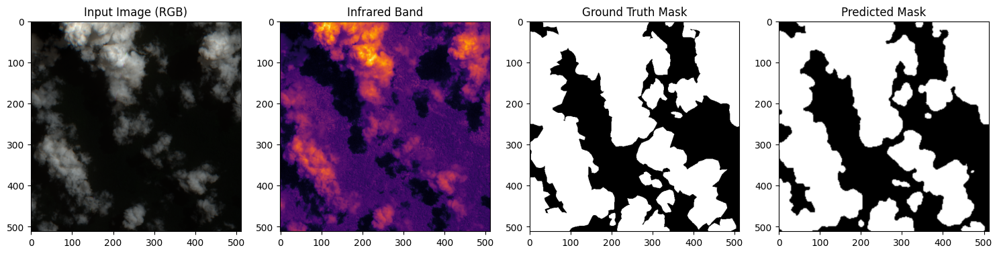

In [24]:
predict_and_display_by_name("100425", new_model, device)

# Logs

In [25]:
# Define the input size to match your training setup 
input_size = (16, 4, 256, 256)

# Use the fixed profiling function
num_ops, num_params = run_profiler(new_model, input_size)

✅ Profiling done. Results saved to model_logs.txt.
   Parameters: 31,038,208
   Operations: 1749.78 GFLOPs


# Script to run model in test set

In [26]:
def predict_mask(image_path, model, device):
    image_np = np.array(tiff.imread(image_path))

    if image_np.ndim == 2:
        image_np = np.expand_dims(image_np, axis=-1)

    if image_np.shape[2] != 4:
        raise ValueError(f"Expected 4 channels (RGB+IR), got shape: {image_np.shape}")

    image_tensor = torch.tensor(image_np.transpose(2, 0, 1), dtype=torch.float32) / 255.0
    image_tensor = T.Resize((256, 256))(image_tensor)
    input_tensor = image_tensor.unsqueeze(0).to(device)

    with torch.no_grad(), amp.autocast():
        output = new_model(input_tensor)
        pred_mask = torch.sigmoid(output)
        pred_mask = (pred_mask > 0.5).float().squeeze().cpu().numpy()
    return pred_mask

def predict_and_display(image_path, pred_mask):
    img = read_tifff(image_path)
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(img[:, :, :3])
    ax[0].set_title("Input Image (RGB)")

    ax[1].imshow(pred_mask, cmap='gray')
    ax[1].set_title("Predicted Mask (256x256)")
    plt.tight_layout()
    plt.show()

In [27]:
# ---------- Run Prediction Loop ----------
IMAGES_DIR = Path("/kaggle/input/cloud-masking-test-set-satellite-cmp25-course/test/test/data")
CSV_PATH = Path("/kaggle/input/cloud-masking-test-set-satellite-cmp25-course/sample_submission.csv")

# Load sample submission
df = pd.read_csv(CSV_PATH, dtype={"id": str})
df["segmentation"] = ""  

for idx, row in df.iterrows():
    image_id = row["id"]
    image_path = IMAGES_DIR / f"{image_id}.tif"

    print(f"\n🔍 Processing: {image_id}")
    pred_mask = predict_mask(image_path, model, device)

    # Encode predicted mask (resize to original if needed)
    encoded_mask = rle_encode(pred_mask)
    df.at[idx, "segmentation"] = encoded_mask

    # Show prediction
    # predict_and_display(image_path, pred_mask)

# Save results
df["id"] = df["id"].astype(str)
df.to_csv("submission.csv", index=False)
print("✅ Submission saved to submission.csv")


🔍 Processing: 402143

🔍 Processing: 877548

🔍 Processing: 942725

🔍 Processing: 769836

🔍 Processing: 263633

🔍 Processing: 747518

🔍 Processing: 632056

🔍 Processing: 331069

🔍 Processing: 104502

🔍 Processing: 000047

🔍 Processing: 487585

🔍 Processing: 890795

🔍 Processing: 283877

🔍 Processing: 000090

🔍 Processing: 986585

🔍 Processing: 238364

🔍 Processing: 516869

🔍 Processing: 850742

🔍 Processing: 274444

🔍 Processing: 187649

🔍 Processing: 000081

🔍 Processing: 293458

🔍 Processing: 000067

🔍 Processing: 905849

🔍 Processing: 841484

🔍 Processing: 636648

🔍 Processing: 711772

🔍 Processing: 661320

🔍 Processing: 391427

🔍 Processing: 403905

🔍 Processing: 534313

🔍 Processing: 799282

🔍 Processing: 000048

🔍 Processing: 701596

🔍 Processing: 000031

🔍 Processing: 726981

🔍 Processing: 689810

🔍 Processing: 548413

🔍 Processing: 777433

🔍 Processing: 810943

🔍 Processing: 692688

🔍 Processing: 000004

🔍 Processing: 563581

🔍 Processing: 927691

🔍 Processing: 000030

🔍 Process